In [1]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [8]:
# Đường dẫn đến thư mục chứa ảnh gốc và mask
original_folder = "IMG/dataset/images"  # folder ảnh gốc
mask_folder = "IMG/dataset/masks"       # folder mask

IMG/dataset/images\vienna15_patch_044.tif
IMG/dataset/masks\vienna15_patch_044.tif


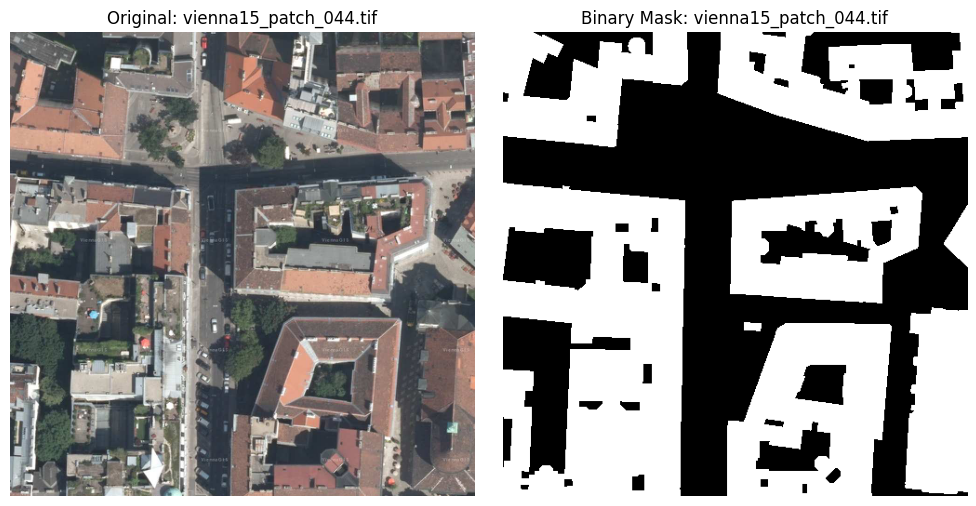

IMG/dataset/images\vienna29_patch_034.tif
IMG/dataset/masks\vienna29_patch_034.tif


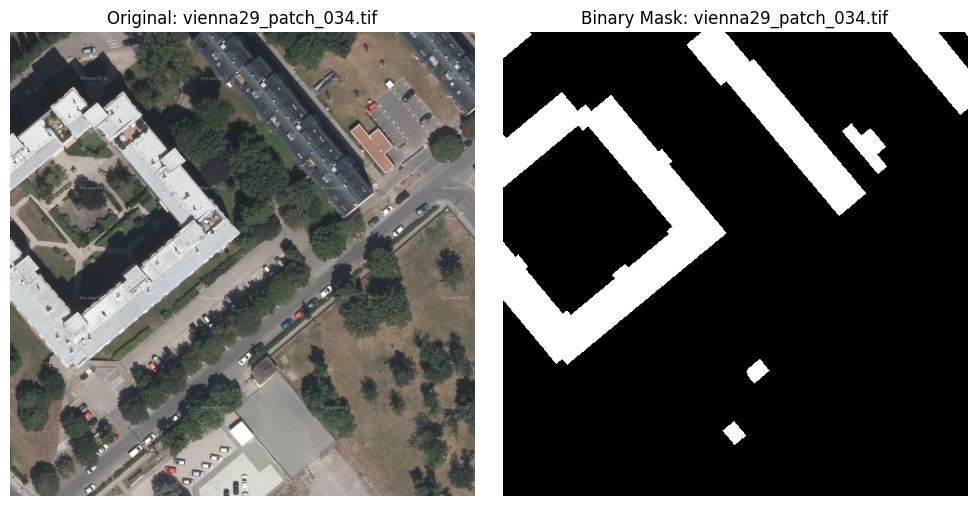

IMG/dataset/images\vienna27_patch_054.tif
IMG/dataset/masks\vienna27_patch_054.tif


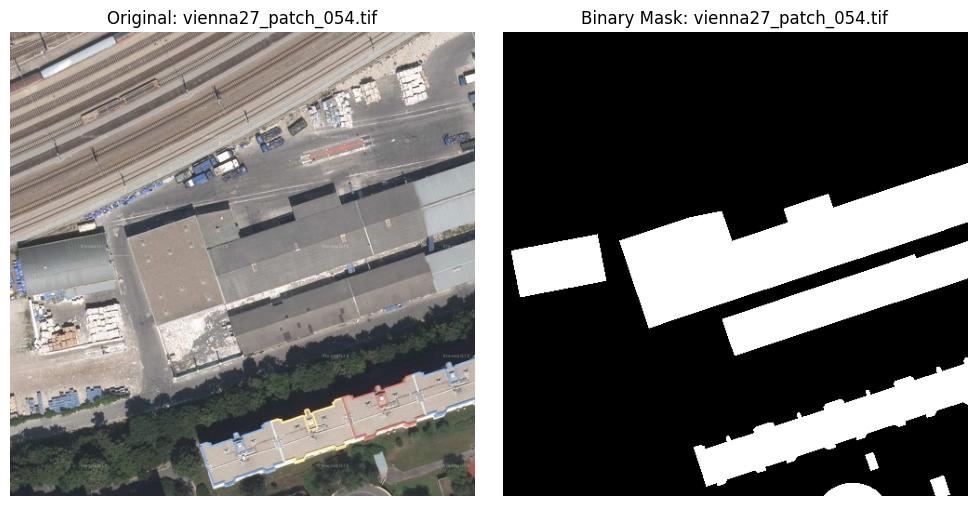

IMG/dataset/images\kitsap13_patch_033.tif
IMG/dataset/masks\kitsap13_patch_033.tif


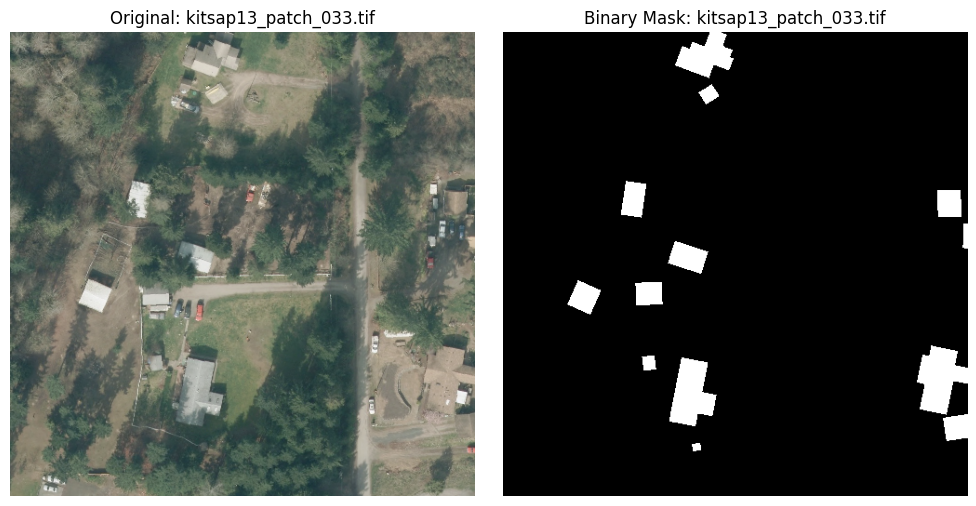

IMG/dataset/images\chicago31_patch_006.tif
IMG/dataset/masks\chicago31_patch_006.tif


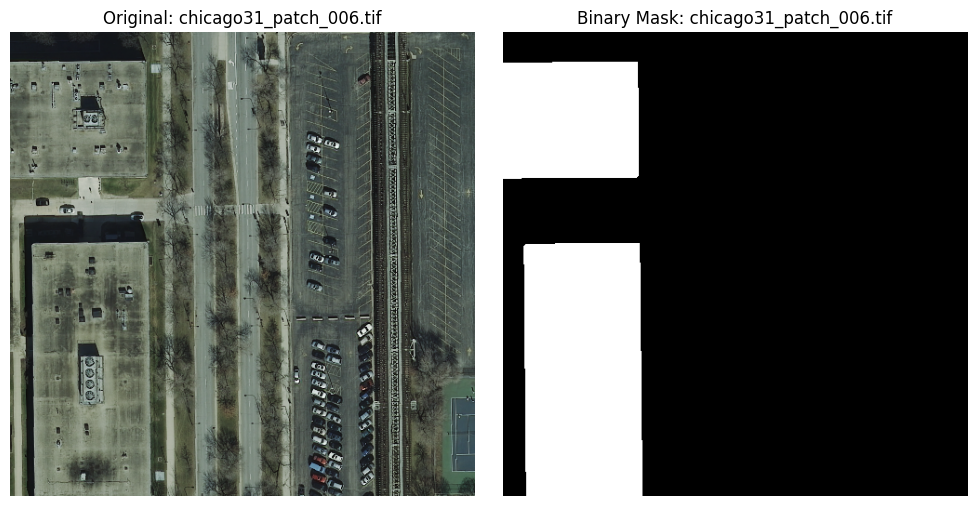

IMG/dataset/images\vienna15_patch_003.tif
IMG/dataset/masks\vienna15_patch_003.tif


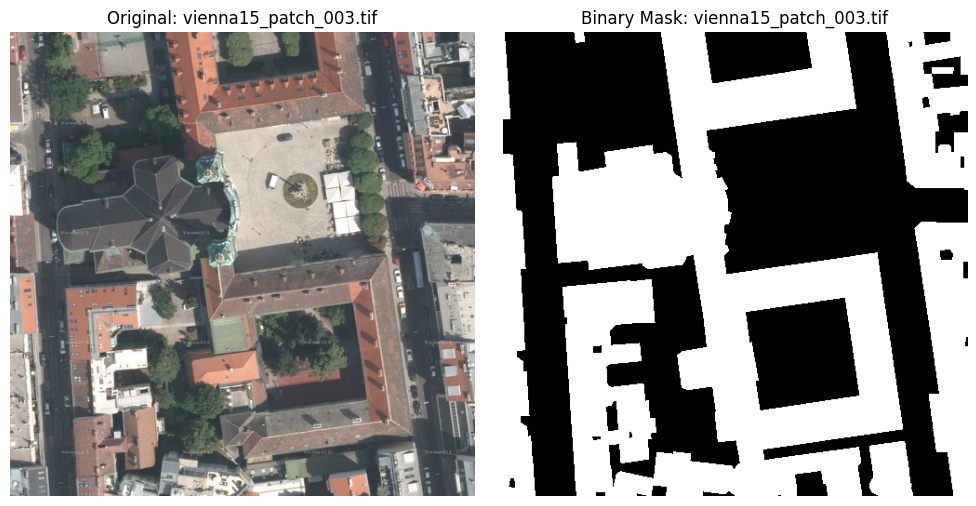

IMG/dataset/images\chicago27_patch_065.tif
IMG/dataset/masks\chicago27_patch_065.tif


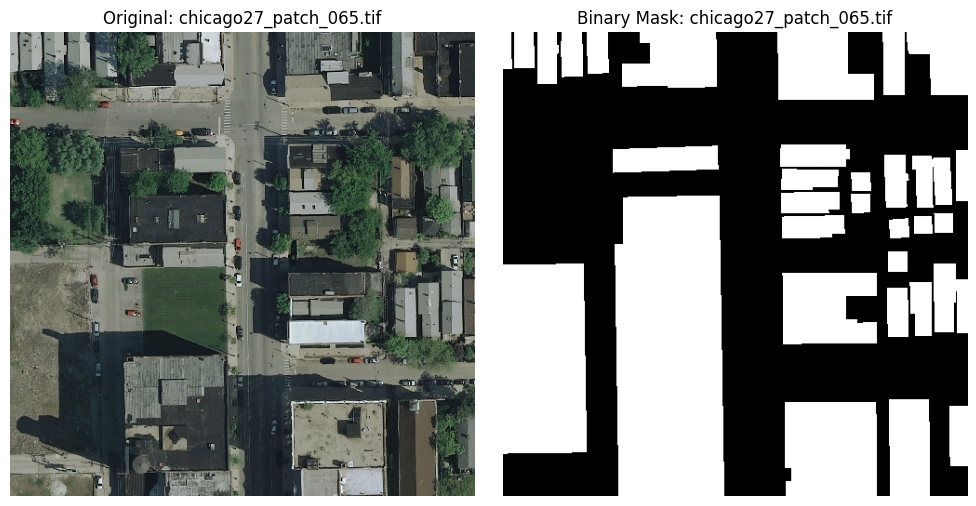

IMG/dataset/images\kitsap36_patch_015.tif
IMG/dataset/masks\kitsap36_patch_015.tif


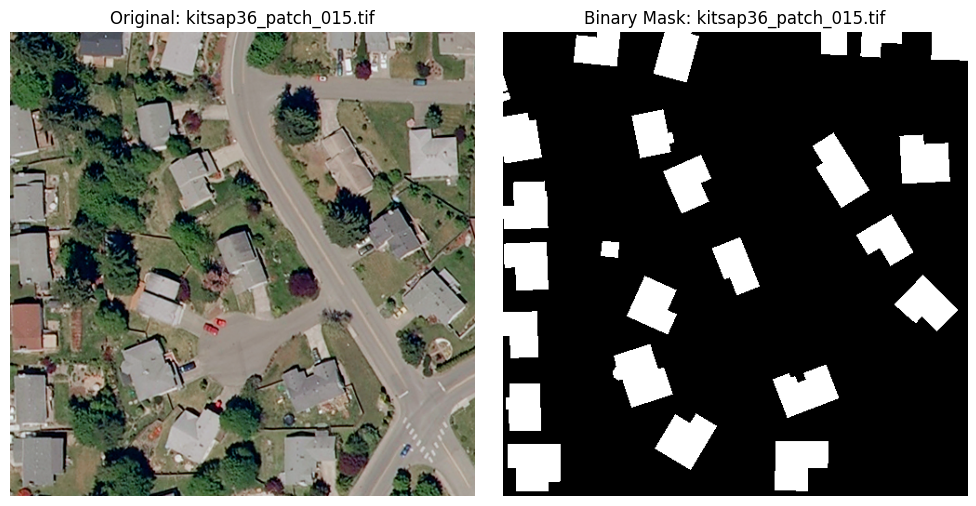

IMG/dataset/images\tyrol-w19_patch_099.tif
IMG/dataset/masks\tyrol-w19_patch_099.tif


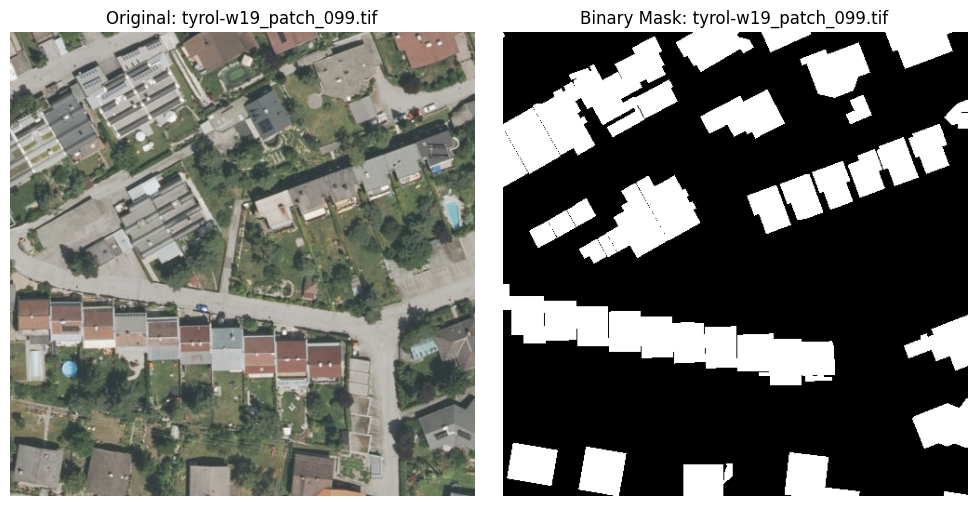

IMG/dataset/images\austin31_patch_003.tif
IMG/dataset/masks\austin31_patch_003.tif


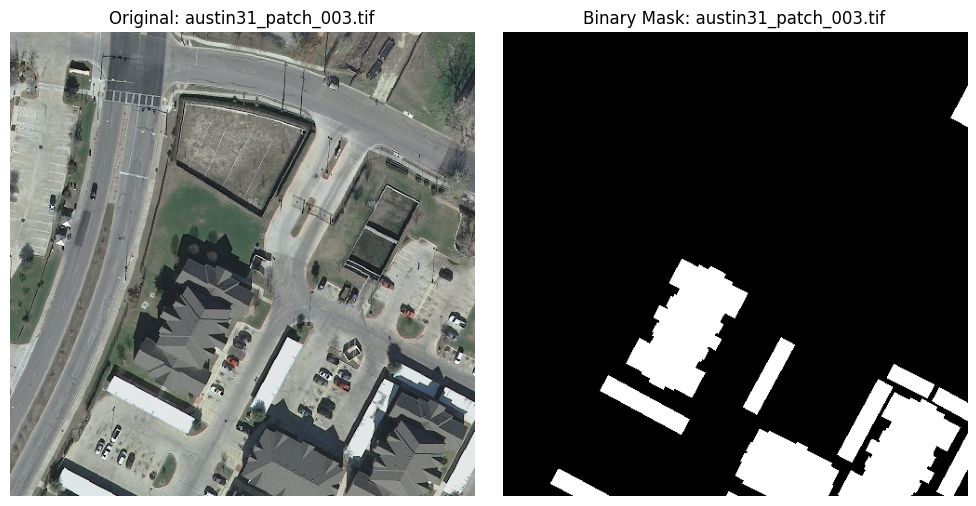

IMG/dataset/images\vienna7_patch_028.tif
IMG/dataset/masks\vienna7_patch_028.tif


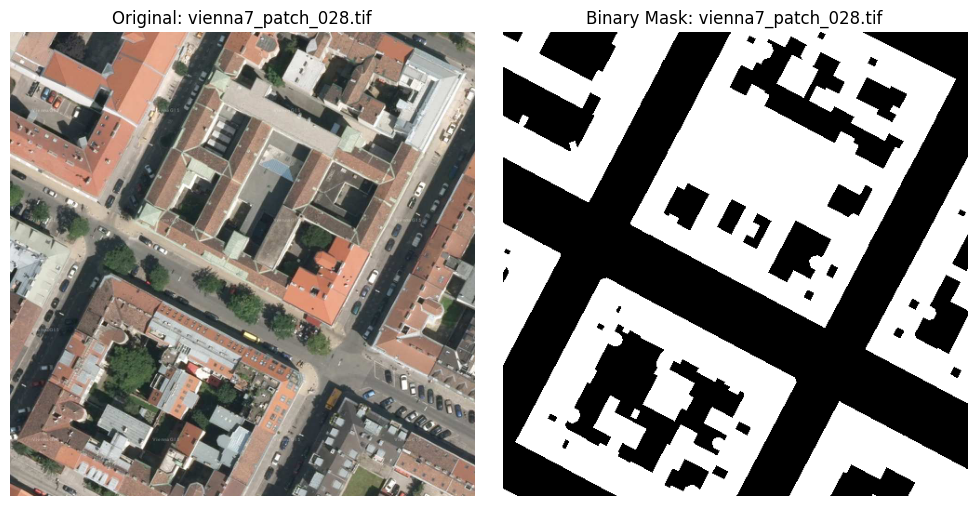

IMG/dataset/images\vienna24_patch_019.tif
IMG/dataset/masks\vienna24_patch_019.tif


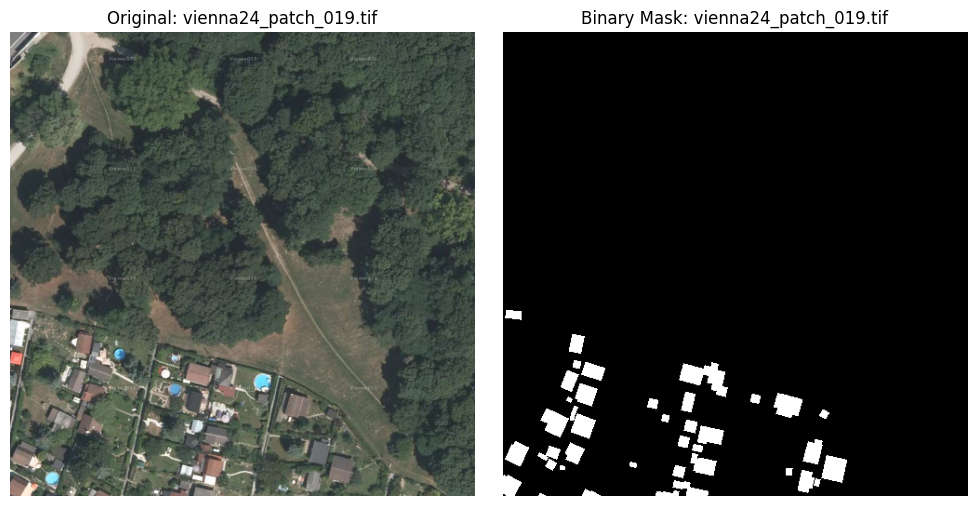

IMG/dataset/images\chicago2_patch_066.tif
IMG/dataset/masks\chicago2_patch_066.tif


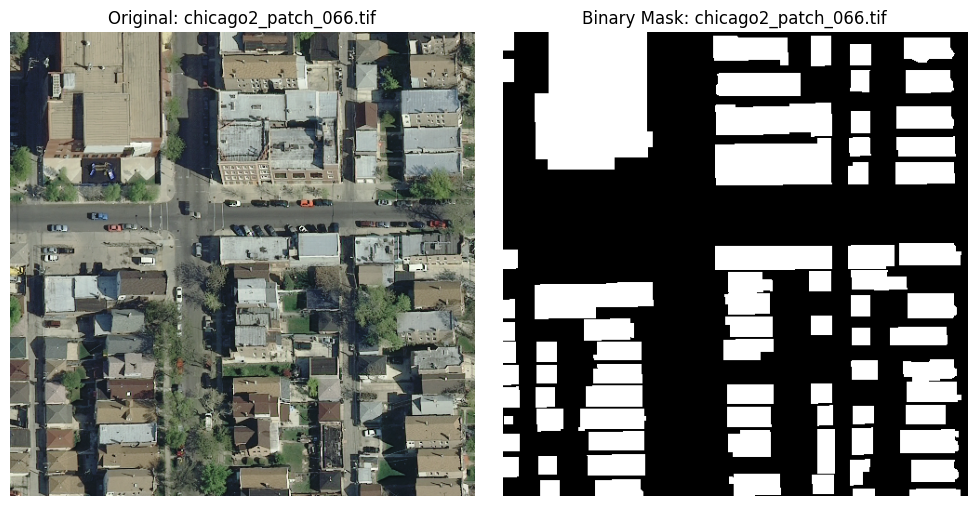

IMG/dataset/images\vienna9_patch_012.tif
IMG/dataset/masks\vienna9_patch_012.tif


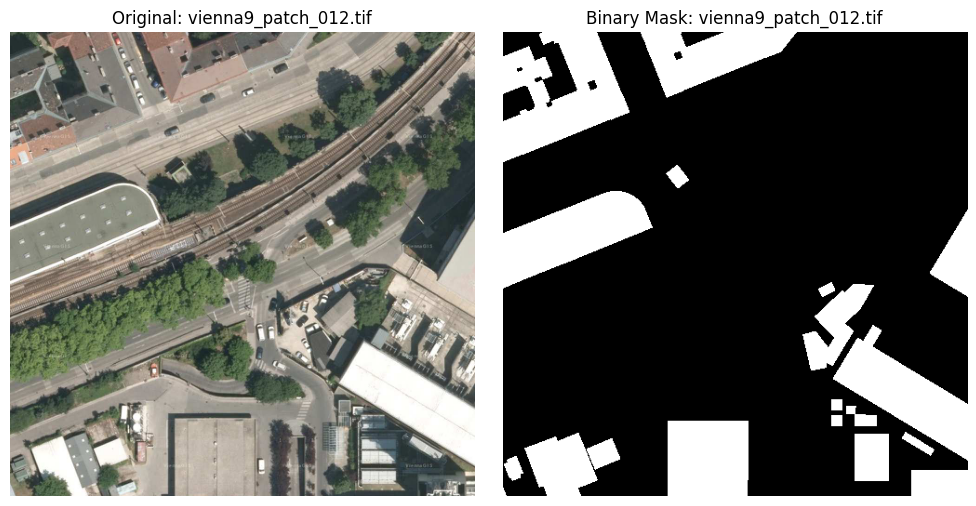

IMG/dataset/images\kitsap25_patch_037.tif
IMG/dataset/masks\kitsap25_patch_037.tif


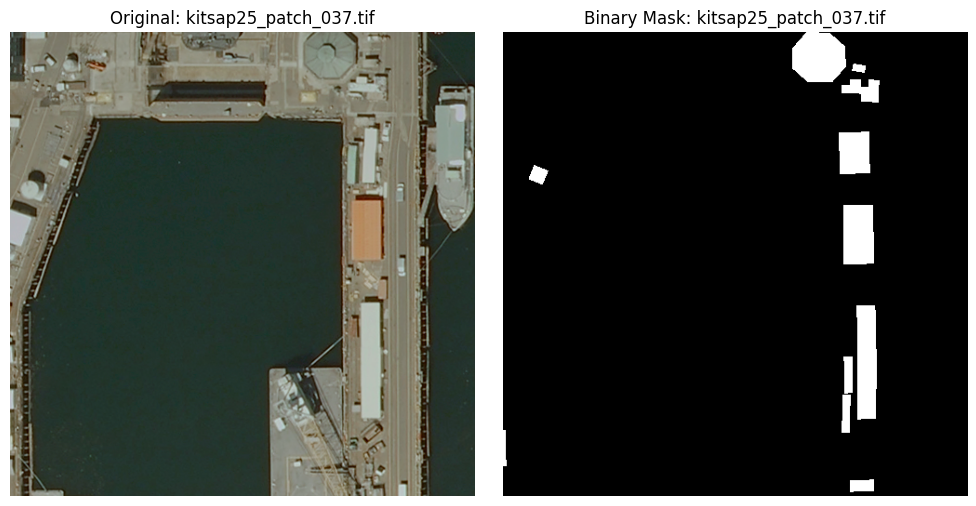

IMG/dataset/images\austin32_patch_039.tif
IMG/dataset/masks\austin32_patch_039.tif


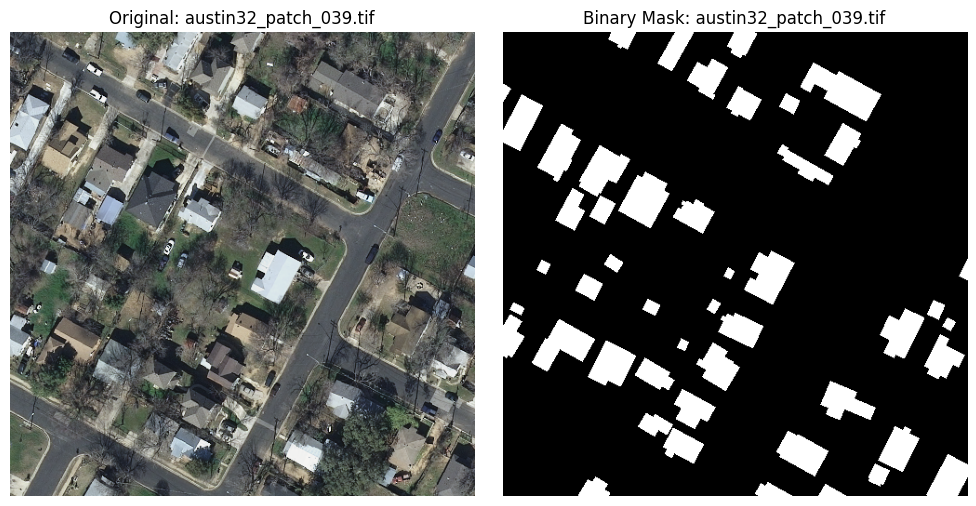

IMG/dataset/images\vienna7_patch_016.tif
IMG/dataset/masks\vienna7_patch_016.tif


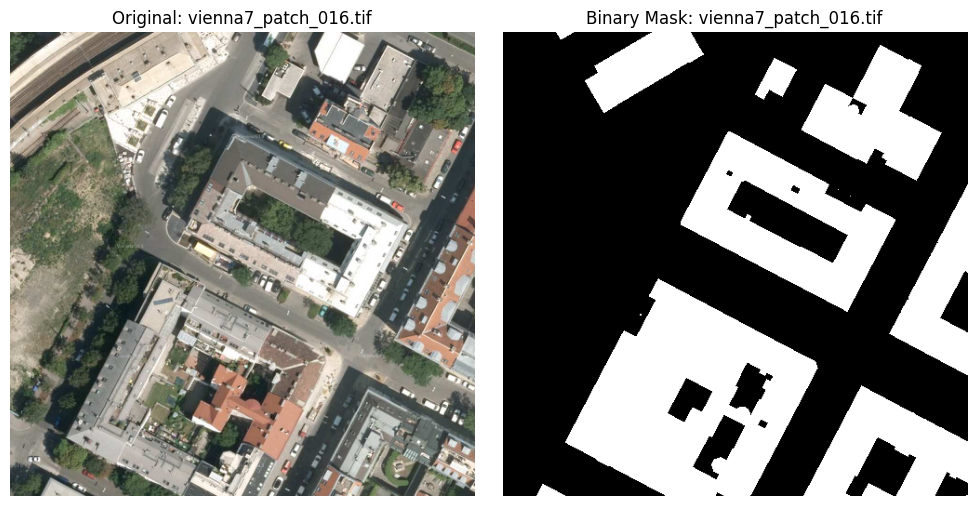

IMG/dataset/images\austin17_patch_004.tif
IMG/dataset/masks\austin17_patch_004.tif


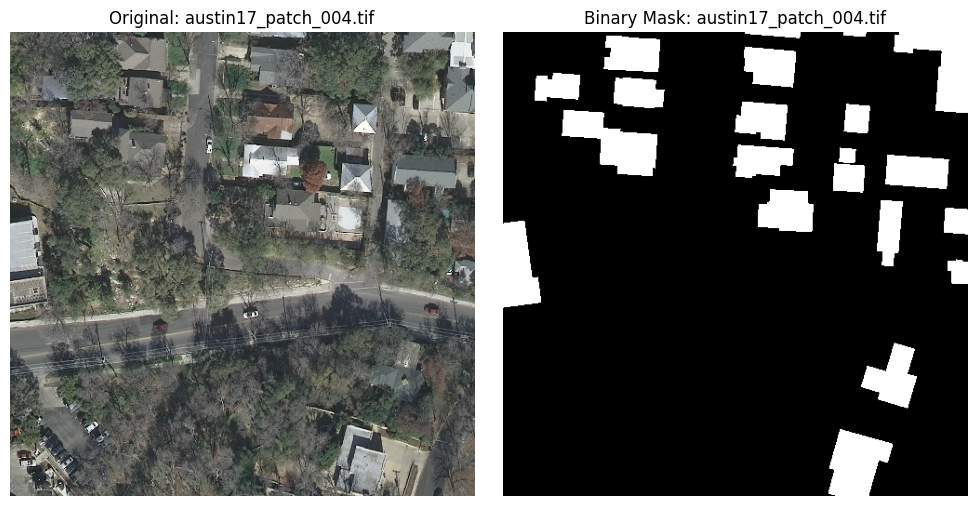

IMG/dataset/images\tyrol-w15_patch_084.tif
IMG/dataset/masks\tyrol-w15_patch_084.tif


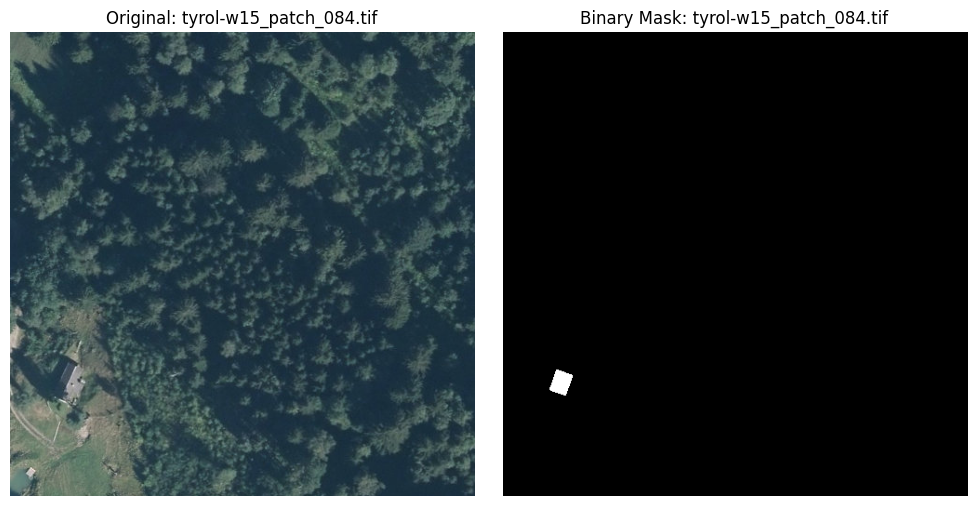

IMG/dataset/images\austin32_patch_000.tif
IMG/dataset/masks\austin32_patch_000.tif


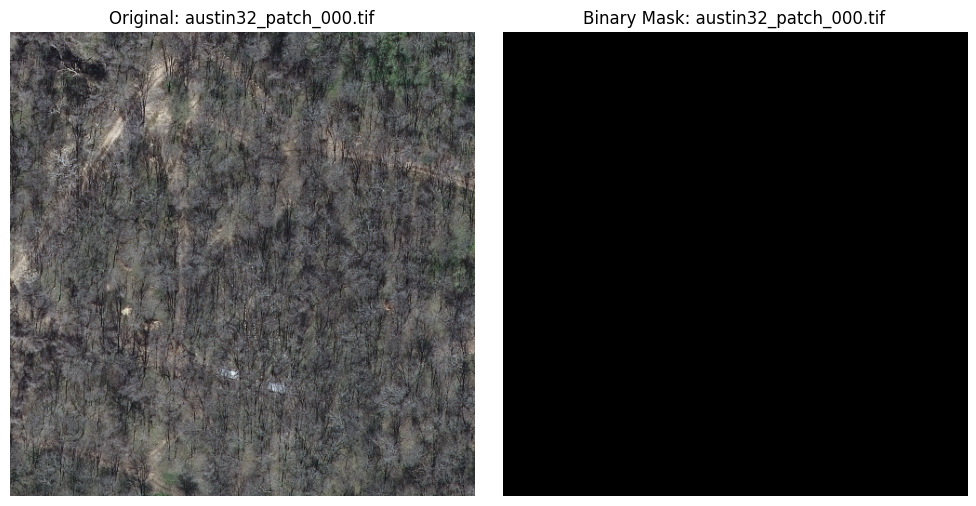

In [10]:
# Get list of available image filenames (just from original folder)
all_files = sorted([f for f in os.listdir(original_folder) if f.endswith('.tif')])

# Randomly pick 3 images
random_files = random.sample(all_files, 20)

for filename in random_files:
    original_path = os.path.join(original_folder, filename)
    print(original_path)
    mask_path = os.path.join(mask_folder, filename)
    print(mask_path)

    if not os.path.exists(mask_path):
        print(f"❌ Mask not found for {filename}")
        continue

    # Load images
    img = Image.open(original_path)
    mask = Image.open(mask_path)

    # Convert to arrays
    img_array = np.array(img)
    mask_array = np.array(mask)

    # Plot side-by-side
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img_array, cmap='gray')
    axes[0].set_title(f"Original: {filename}")
    axes[0].axis('off')

    axes[1].imshow(mask_array, cmap='gray')
    axes[1].set_title(f"Binary Mask: {filename}")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

## CONVERT .PND qua file .TIF vì Model được train trên file .TIF

In [2]:
# Chuyển đổi định dạng từ PNG sang TIF
from PIL import Image

image_name = "test4" # Tên tệp cần chuyển đổi

# Mở tệp PNG
png_image = Image.open(image_name+".png").convert("RGB") # Ép xuống 3 kênh màu (vài ảnh có 4 kênh màu)

# Lưu tệp PNG dưới dạng TIFF
png_image.save(image_name+".tif", format="TIFF")


## Cắt nhỏ hình từ Dataset trên mạng

In [2]:
import cv2

In [10]:
# Hàm cắt ảnh thành các mảnh nhỏ và lưu vào thư mục
# Chức năng này cắt ảnh thành các mảnh nhỏ và lưu vào thư mục đầu ra do ảnh gốc từ mạng rất bự (5000x5000 pixel). 
# Mục tiêu là cắt ảnh thành các mảnh nhỏ hơn (512x512 pixel) để dễ dàng xử lý và lưu trữ.
def chop_and_save(image_path, output_folder, patch_size=512):
    # Lấy tên file (vd., "house123.tif" -> "house123")
    file_name = os.path.splitext(os.path.basename(image_path))[0]
    isPadded = False # Biến kiểm tra xem ảnh đã được pad hay chưa
    
    os.makedirs(output_folder, exist_ok=True) # Tạo thư mục đầu ra nếu chưa tồn tại

    # Mở ảnh
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED) 

    if img is None: # Kiểm tra xem ảnh có được mở thành công không
        print(f"Failed to read image: {image_path}")
        return

    height, width = img.shape[:2] # Lấy kích thước ảnh
    count = 0

    # Cắt ảnh thành các mảnh nhỏ
    for y in range(0, height, patch_size):
        for x in range(0, width, patch_size):
            isPadded = False
            patch = img[y:y+patch_size, x:x+patch_size] # Cắt mảnh ảnh
            
            # Nếu patch nhỏ hơn patch_size, pad thêm cho đủ
            if patch.shape[0] != patch_size or patch.shape[1] != patch_size:
                patch = cv2.copyMakeBorder(patch,0, patch_size - patch.shape[0],0, patch_size - patch.shape[1],cv2.BORDER_CONSTANT,value=0)  # Màu đen (0, 0, 0) cho các pixel được thêm vào
                print(f"Padding patch at ({x}, {y}) to size {patch_size}x{patch_size}")
                isPadded = True

            # Lưu mảnh thành file tif mới
            patch_filename = f"{file_name}_patch_{count:03}.tif"
            patch_path = os.path.join(output_folder, patch_filename)
            cv2.imwrite(patch_path, patch)
            count += 1
            print(f"{y}.{count}. Saved patch {patch_filename} at ({x}, {y}), Padded is {isPadded}.")

    print(f"\n===\n{y}. Saved {count} patches of {file_name} to {output_folder} with size {patch_size}x{patch_size}\n===\n")


In [ ]:
# Gọi hàm chop_and_save
chop_and_save('austin1.tif', 'IMG/dataset/images')
chop_and_save('austin1_mask.tif', 'IMG/dataset/masks')

Saved 100 patches to austin1/output_austin1
Saved 100 patches to austin1/output_austin1_masks


In [8]:
# Hàm xử lý thư mục đầu vào
def process_folder(input_folder, output_folder, patch_size=512):
    for filename in os.listdir(input_folder):
        if filename.lower().endswith('.tif'):
            image_path = os.path.join(input_folder, filename)
            chop_and_save(image_path, output_folder, patch_size)

In [11]:
# Gọi hàm process_folder cho cả hai thư mục
process_folder('IMG/AerialImageDataset/train/images', 'IMG/dataset512px/images')
process_folder('IMG/AerialImageDataset/train/gt', 'IMG/dataset512px/masks')

0.1. Saved patch austin1_patch_000.tif at (0, 0), Padded is False.
0.2. Saved patch austin1_patch_001.tif at (512, 0), Padded is False.
0.3. Saved patch austin1_patch_002.tif at (1024, 0), Padded is False.
0.4. Saved patch austin1_patch_003.tif at (1536, 0), Padded is False.
0.5. Saved patch austin1_patch_004.tif at (2048, 0), Padded is False.
0.6. Saved patch austin1_patch_005.tif at (2560, 0), Padded is False.
0.7. Saved patch austin1_patch_006.tif at (3072, 0), Padded is False.
0.8. Saved patch austin1_patch_007.tif at (3584, 0), Padded is False.
0.9. Saved patch austin1_patch_008.tif at (4096, 0), Padded is False.
Padding patch at (4608, 0) to size 512x512
0.10. Saved patch austin1_patch_009.tif at (4608, 0), Padded is True.
512.11. Saved patch austin1_patch_010.tif at (0, 512), Padded is False.
512.12. Saved patch austin1_patch_011.tif at (512, 512), Padded is False.
512.13. Saved patch austin1_patch_012.tif at (1024, 512), Padded is False.
512.14. Saved patch austin1_patch_013.ti

## Kiểm tra kích thước ảnh trong dataset

In [12]:
# Hàm kiểm tra kích thước ảnh
def check_image_sizes(folder_path, expected_size=(512, 512)):
    wrong_size_images = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.tif', '.tiff', '.jpg', '.jpeg', '.png', '.bmp')):
            image_path = os.path.join(folder_path, filename)
            img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
            if img is None:
                print(f"Could not read image: {filename}")
                continue

            h, w = img.shape[:2]
            if (w, h) != expected_size:
                print(f"{filename} has size {w}x{h} instead of {expected_size[0]}x{expected_size[1]}")
                wrong_size_images.append((filename, w, h))

    if not wrong_size_images:
        print("All images are 512x512.")
    else:
        print(f"\nTotal images with wrong size: {len(wrong_size_images)}")

In [13]:
check_image_sizes('IMG/dataset512px/images')
check_image_sizes('IMG/dataset512px/masks')

All images are 512x512.
All images are 512x512.
